<a href="https://colab.research.google.com/github/SidddhantJain/ML_Creditscore_classification/blob/main/ML_creditscore.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1️ Import Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE

# 2️ Load Data

In [3]:
# Load Data
train_df = pd.read_csv('/content/drive/MyDrive/Dataset (1)/train.csv', dtype={26: str})
test_df = pd.read_csv('/content/drive/MyDrive/Dataset (1)/test.csv', dtype={26: str})

In [4]:
test_df

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x160a,CUS_0xd40,September,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,2022.0,Good,809.98,35.030402,22 Years and 9 Months,No,49.574949,236.64268203272135,Low_spent_Small_value_payments,186.26670208571772
1,0x160b,CUS_0xd40,October,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,High_spent_Medium_value_payments,361.44400385378196
2,0x160c,CUS_0xd40,November,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,Low_spent_Medium_value_payments,264.67544623342997
3,0x160d,CUS_0xd40,December,Aaron Maashoh,24_,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,32.430559,23 Years and 0 Months,No,49.574949,39.08251089460281,High_spent_Medium_value_payments,343.82687322383634
4,0x1616,CUS_0x21b1,September,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.986667,2,...,5.0,Good,605.03,25.926822,27 Years and 3 Months,No,18.816215,39.684018417945296,High_spent_Large_value_payments,485.2984336755923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0x25fe5,CUS_0x8600,December,Sarah McBridec,4975,031-35-0942,Architect,20002.88,1929.906667,10,...,12.0,_,3571.7,34.780553,NaN,Yes,60.964772,146.48632477751087,Low_spent_Small_value_payments,275.53956951573343
49996,0x25fee,CUS_0x942c,September,Nicks,25,078-73-5990,Mechanic,39628.99,NaN,4,...,7.0,Good,502.38,27.758522,31 Years and 11 Months,NM,35.104023,181.44299902757518,Low_spent_Small_value_payments,409.39456169535066
49997,0x25fef,CUS_0x942c,October,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,7.0,Good,502.38,36.858542,32 Years and 0 Months,No,35.104023,__10000__,Low_spent_Large_value_payments,349.7263321025098
49998,0x25ff0,CUS_0x942c,November,Nicks,25,078-73-5990,Mechanic,39628.99,NaN,4,...,7.0,Good,502.38,39.139840,32 Years and 1 Months,No,35.104023,97.59857973344877,High_spent_Small_value_payments,463.23898098947717


In [5]:
train_df


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.86622816574095,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.651610435322,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.8090832742814,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.1649785257098,Standard


# 3️ Drop Unnecessary Columns


In [6]:
# Drop Unnecessary Columns
drop_columns = ['ID', 'Customer_ID', 'Name', 'SSN', 'Month']
train_df.drop(columns=drop_columns, inplace=True, errors='ignore')
test_df.drop(columns=drop_columns, inplace=True, errors='ignore')

# 4️ Handle Missing Values


In [7]:
# Handle Missing Values
numeric_cols = train_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
train_df[numeric_cols] = train_df[numeric_cols].apply(pd.to_numeric, errors='coerce')
test_df[numeric_cols] = test_df[numeric_cols].apply(pd.to_numeric, errors='coerce')
train_df.fillna(train_df.median(numeric_only=True), inplace=True)
test_df.fillna(test_df.median(numeric_only=True), inplace=True)

# 5️ Encode Categorical Variables

In [8]:
# Encode Categorical Variables
categorical_cols = train_df.select_dtypes(include=['object']).columns.tolist()
if 'Credit_Score' in categorical_cols:
    categorical_cols.remove('Credit_Score')

test_common_categorical = [col for col in categorical_cols if col in test_df.columns]
encoder = OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1)
train_df[categorical_cols] = encoder.fit_transform(train_df[categorical_cols])
test_df[test_common_categorical] = encoder.transform(test_df[test_common_categorical])


In [9]:
scaler = StandardScaler()
if 'Credit_Score' in numeric_cols:
    numeric_cols.remove('Credit_Score')  # Ensure Credit_Score is not scaled
train_df[numeric_cols] = scaler.fit_transform(train_df[numeric_cols])
test_df[numeric_cols] = scaler.transform(test_df[numeric_cols])

In [10]:
# Ensure Labels Have Only "Good", "Poor", "Standard"
def clean_labels(label):
    if label not in ["Good", "Poor", "Standard"]:
        return "Standard"  # Defaulting any unexpected label to Standard
    return label

train_df['Credit_Score'] = train_df['Credit_Score'].astype(str).apply(clean_labels)
if 'Credit_Score' in test_df.columns:
    test_df['Credit_Score'] = test_df['Credit_Score'].astype(str).apply(clean_labels)


# 6️ Train


In [11]:
# Split Data
X = train_df.drop(columns=['Credit_Score'])
y = train_df['Credit_Score']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [12]:
# Handle Class Imbalance
print(X_train.isna().sum().sum())  # Check the total count of NaN values
X_train.fillna(X_train.median(numeric_only=True), inplace=True)

smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

26508


In [13]:
# Train and Evaluate Models
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
}

In [14]:
for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"{name} Accuracy:", accuracy_score(y_test, y_pred))
    print(f"{name} Classification Report:\n", classification_report(y_test, y_pred))
    print(f"{name} Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("-" * 50)


Training Random Forest...
Random Forest Accuracy: 0.77785
Random Forest Classification Report:
               precision    recall  f1-score   support

        Good       0.69      0.76      0.72      3527
        Poor       0.77      0.80      0.78      5874
    Standard       0.82      0.77      0.80     10599

    accuracy                           0.78     20000
   macro avg       0.76      0.78      0.77     20000
weighted avg       0.78      0.78      0.78     20000

Random Forest Confusion Matrix:
 [[2664   25  838]
 [ 204 4701  969]
 [1005 1402 8192]]
--------------------------------------------------
Training Decision Tree...
Decision Tree Accuracy: 0.6857
Decision Tree Classification Report:
               precision    recall  f1-score   support

        Good       0.61      0.63      0.62      3527
        Poor       0.67      0.67      0.67      5874
    Standard       0.72      0.72      0.72     10599

    accuracy                           0.69     20000
   macro avg     

In [15]:
 joblib.dump(model, f'{name.replace(" ", "_").lower()}_model.pkl')

['decision_tree_model.pkl']

<ipython-input-16-f44d84208b4d>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y, palette="viridis")


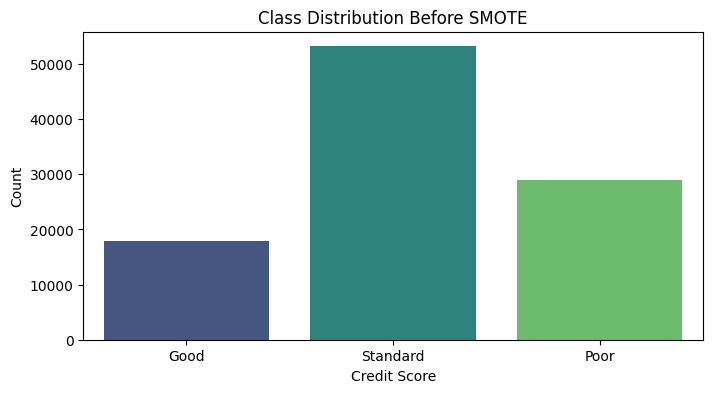

<ipython-input-16-f44d84208b4d>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_train, palette="viridis")


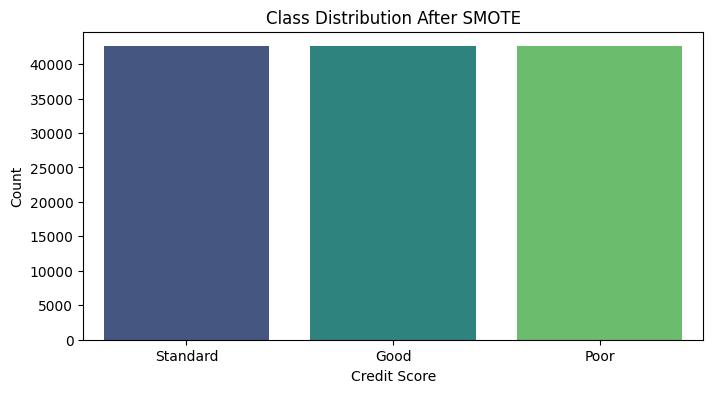

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Before SMOTE
plt.figure(figsize=(8, 4))
sns.countplot(x=y, palette="viridis")
plt.title("Class Distribution Before SMOTE")
plt.xlabel("Credit Score")
plt.ylabel("Count")
plt.show()

# After SMOTE
plt.figure(figsize=(8, 4))
sns.countplot(x=y_train, palette="viridis")
plt.title("Class Distribution After SMOTE")
plt.xlabel("Credit Score")
plt.ylabel("Count")
plt.show()


<ipython-input-17-ad388706e1eb>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances, y=features, palette="coolwarm")


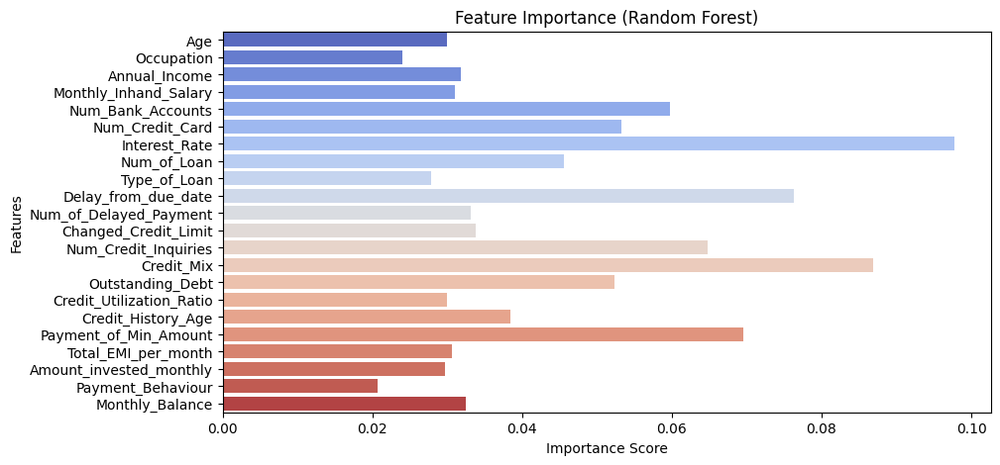

In [17]:
importances = models["Random Forest"].feature_importances_
features = X.columns
plt.figure(figsize=(10, 5))
sns.barplot(x=importances, y=features, palette="coolwarm")
plt.title("Feature Importance (Random Forest)")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()


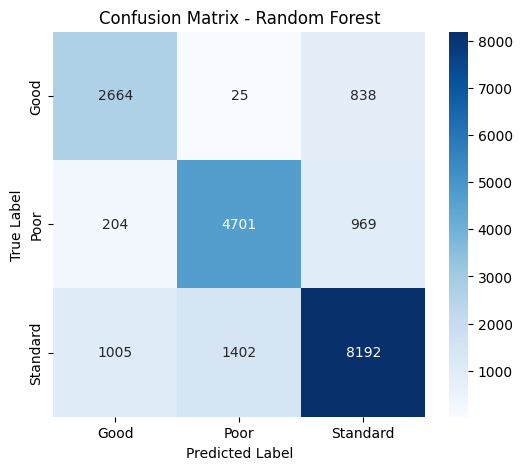

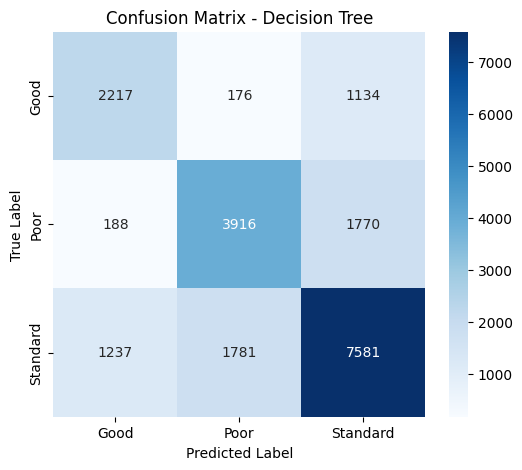

In [18]:
from sklearn.metrics import confusion_matrix
import numpy as np

def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Good", "Poor", "Standard"], yticklabels=["Good", "Poor", "Standard"])
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

for name, model in models.items():
    y_pred = model.predict(X_test)
    plot_confusion_matrix(y_test, y_pred, name)


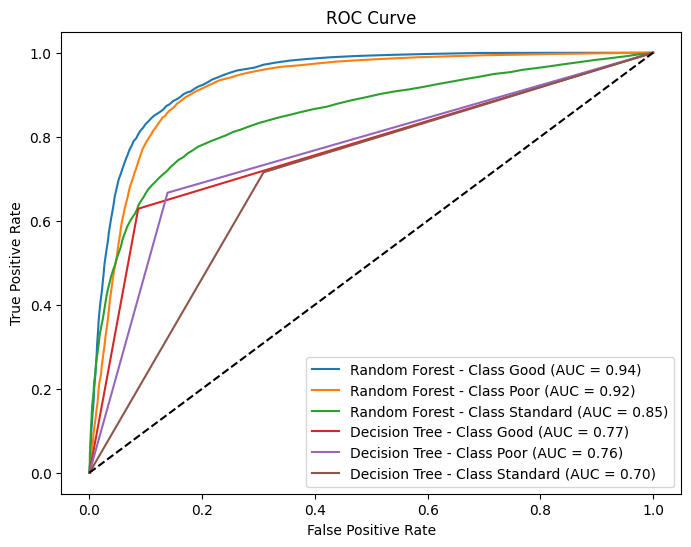

In [19]:


from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import LabelBinarizer

lb = LabelBinarizer()
y_test_binarized = lb.fit_transform(y_test)

plt.figure(figsize=(8, 6))
for name, model in models.items():
    if hasattr(model, "decision_function"):
        y_score = model.decision_function(X_test)
    else:
        y_score = model.predict_proba(X_test)

    for i in range(y_test_binarized.shape[1]):
        fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{name} - Class {lb.classes_[i]} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


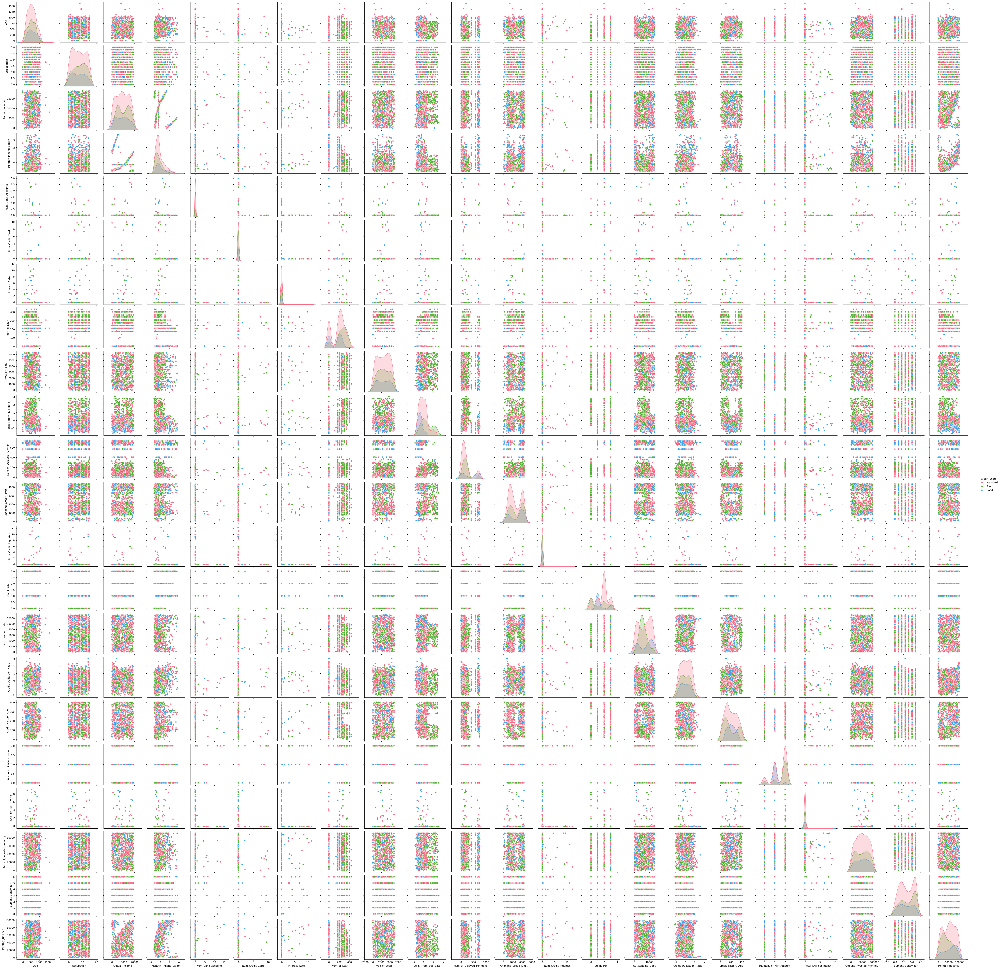

In [20]:
import seaborn as sns

sampled_df = train_df.sample(1000)  # Take a smaller sample for faster visualization
sns.pairplot(sampled_df, hue="Credit_Score", palette="husl", diag_kind="kde")
plt.show()


<ipython-input-21-8e55bb30a468>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=train_df["Credit_Score"], y=train_df[col], palette="pastel")
<ipython-input-21-8e55bb30a468>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=train_df["Credit_Score"], y=train_df[col], palette="pastel")
<ipython-input-21-8e55bb30a468>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=train_df["Credit_Score"], y=train_df[col], palette="pastel")
<ipython-input-21-8e55bb30a468>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and wil

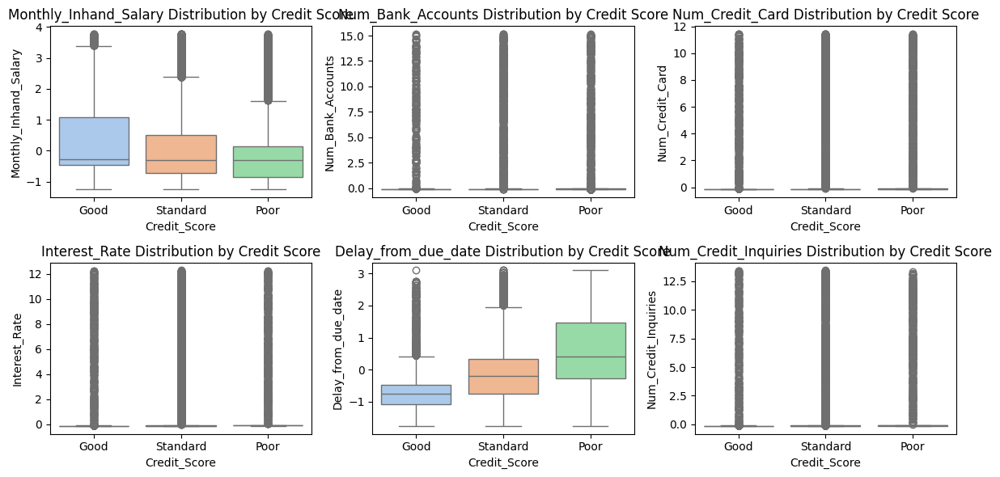

In [21]:

plt.figure(figsize=(12, 6))
for i, col in enumerate(numeric_cols[:6]):  # Plot only a few to avoid clutter
    plt.subplot(2, 3, i + 1)
    sns.boxplot(x=train_df["Credit_Score"], y=train_df[col], palette="pastel")
    plt.title(f"{col} Distribution by Credit Score")
plt.tight_layout()
plt.show()


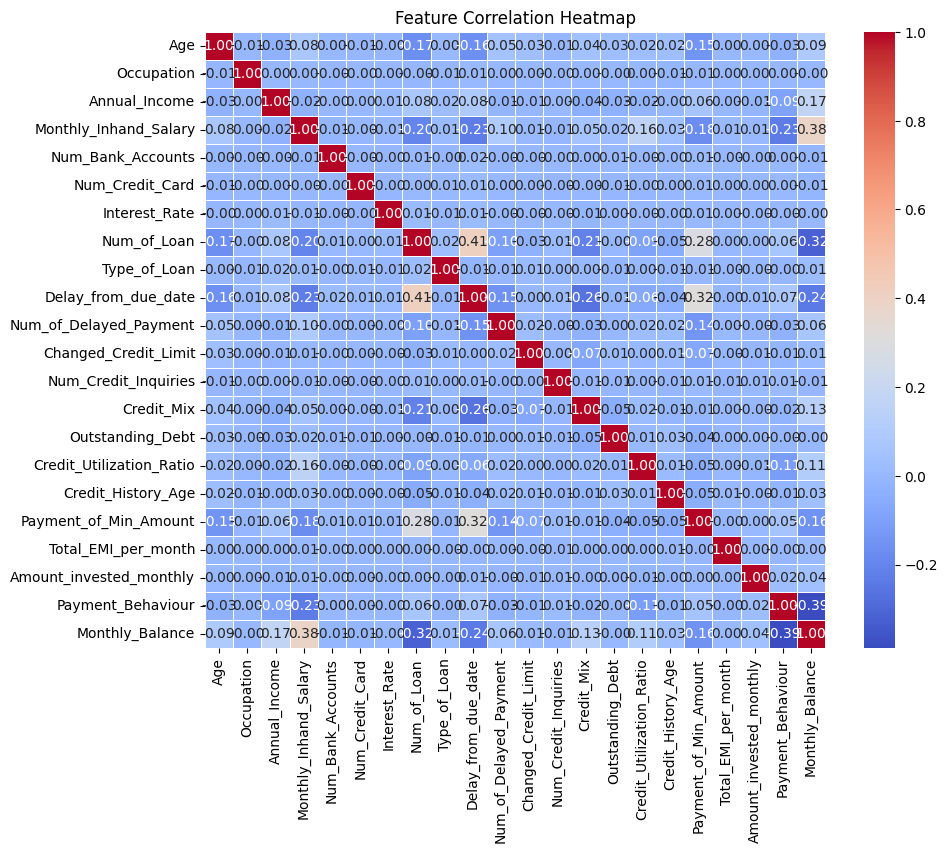

In [22]:
plt.figure(figsize=(10, 8))
sns.heatmap(train_df.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()


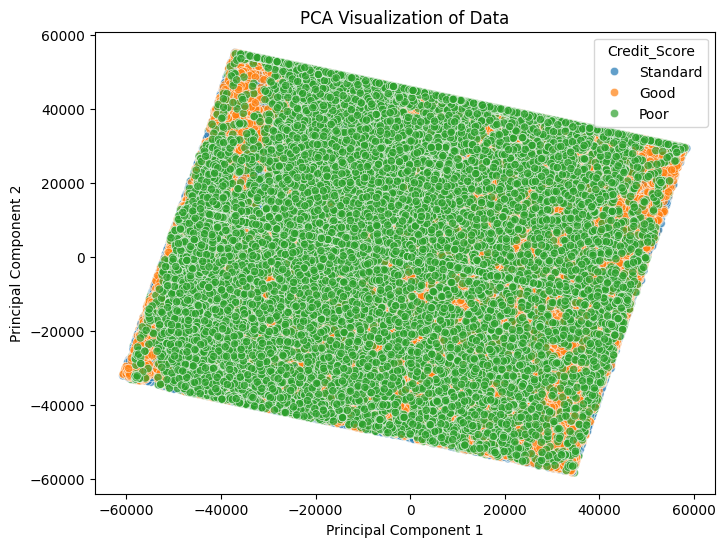

In [23]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=y_train, palette="tab10", alpha=0.7)
plt.title("PCA Visualization of Data")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()


<ipython-input-24-e128e5417f7c>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), palette="coolwarm")


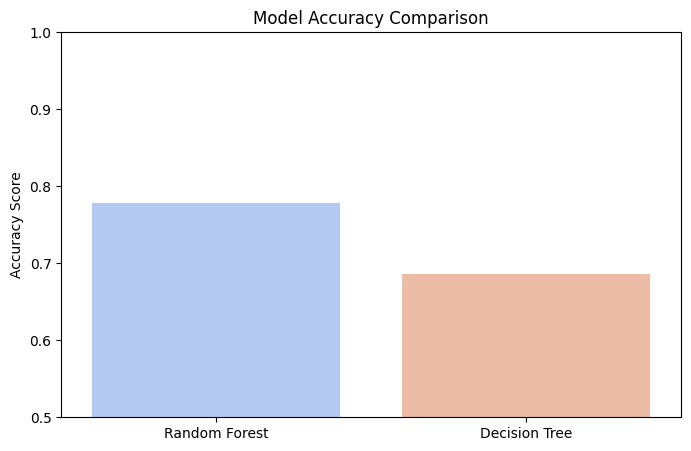

In [24]:
model_scores = {name: accuracy_score(y_test, model.predict(X_test)) for name, model in models.items()}

plt.figure(figsize=(8, 5))
sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), palette="coolwarm")
plt.ylabel("Accuracy Score")
plt.title("Model Accuracy Comparison")
plt.ylim(0.5, 1.0)
plt.show()
